In [1]:
%load_ext autoreload 
%autoreload 2

In [2]:
from raw_to_dataset import sample_points_fixed
import matplotlib.pyplot as plt


def show_plot_name(points, label, color="blue", show_lines=True):
    xs, zs, ys = zip(*points) # NOTE: y and z axes are swapped, plt treats z axis as height

    fig = plt.figure(figsize=(15, 5))

    linestyle = 'None'
    if (show_lines):
        linestyle = 'solid'

    # --- Default angle ---
    ax1 = fig.add_subplot(131, projection='3d')
    ax1.plot(xs, ys, zs, marker='o', color=color, linestyle=linestyle)
    ax1.set_title(f"{label}")
    ax1.set_xlabel('x')
    ax1.set_ylabel('y')
    ax1.set_zlabel('z')

    # --- Behind view ---
    ax2 = fig.add_subplot(132, projection='3d')
    ax2.plot(xs, ys, zs, marker='o', color=color, linestyle=linestyle)
    ax2.view_init(elev=10, azim=180)
    ax2.set_title(f"{label}")
    ax2.set_xlabel('x')
    ax2.set_ylabel('y')
    ax2.set_zlabel('z')

    # --- Bird's-eye view ---
    ax3 = fig.add_subplot(133, projection='3d')
    ax3.plot(xs, ys, zs, marker='o', color=color, linestyle=linestyle)
    ax3.view_init(elev=90, azim=-90)
    ax3.set_title(f"{label}")
    ax3.set_xlabel('x')
    ax3.set_ylabel('y')
    ax3.set_zlabel('z')

    ax1.set_aspect('equal', adjustable='box')
    ax2.set_aspect('equal', adjustable='box')
    ax3.set_aspect('equal', adjustable='box')


    plt.tight_layout()
    return plt

In [3]:
import numpy as np
import os
from raw_to_dataset import load_drawing_xyz, furthest_point_sampling


def get_json_filepaths(drawing_name, base_path):
    adjusted_path = f"{base_path}{drawing_name}/"
    
    names = [(adjusted_path + f) for f in os.listdir(adjusted_path) if os.path.isfile(os.path.join(adjusted_path, f))]
    return names

def show_all_plots(drawing_name, base_path, uniform_color=None):
    """
    Shows all plots for a given drawing
    drawing_name: Name of the drawing's folder within the 'base_path' directory
    base_path: Location of the data directory to look at, should contain named subdirs for 
               each drawing with their respective json files
    """
    files = get_json_filepaths(drawing_name, base_path)

    # Compare furthest point sampling to linear resample:
    plot_colors = ['b', 'g', 'r', 'c', 'm']
    for i, filepath in enumerate(files):
        raw_points = load_drawing_xyz(filepath, resample=False)
        points = furthest_point_sampling(raw_points, 128, jitter_ratio=1e-2, jitter_upscale=False)

        upscaled = furthest_point_sampling(raw_points, 128, jitter_ratio=1e-2, jitter_upscale=True)
        
        if uniform_color == None:
            color = plot_colors[i % len(plot_colors)]
        else:
            color = uniform_color
        
        # show_plot_name(points     = points,
        #             label      = f"drawing{i + 1} (FPS), original size: {len(raw_points)}", 
        #             color      = color,
        #             show_lines = False)
        
        show_plot_name(points     = upscaled, 
                    label      = f"drawing{i + 1}, original size: {len(raw_points)}", 
                    color      = color,
                    show_lines = False)
        
        if (len(raw_points) < 128):
            print(f"drawing {i} is under 128 points ({len(raw_points)}), consider recapturing. Duplicated and Jittered {len(points) - len(raw_points)} points randomly.")

def show_validation_data(validation_dir):
    for folder in os.listdir(validation_dir):
        # print(folder)
        show_all_plots(folder, validation_dir)

C:\Users\gdyer\AppData\Local\Temp\ipykernel_31920\1038087896.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(15, 5))


drawing 1 is under 128 points (118), consider recapturing. Duplicated and Jittered 10 points randomly.
drawing 3 is under 128 points (113), consider recapturing. Duplicated and Jittered 15 points randomly.
drawing 0 is under 128 points (104), consider recapturing. Duplicated and Jittered 24 points randomly.
drawing 1 is under 128 points (93), consider recapturing. Duplicated and Jittered 35 points randomly.
drawing 2 is under 128 points (75), consider recapturing. Duplicated and Jittered 53 points randomly.
drawing 3 is under 128 points (83), consider recapturing. Duplicated and Jittered 45 points randomly.
drawing 0 is under 128 points (99), consider recapturing. Duplicated and Jittered 29 points randomly.
drawing 1 is under 128 points (126), consider recapturing. Duplicated and Jittered 2 points randomly.
drawing 2 is under 128 points (114), consider recapturing. Duplicated and Jittered 14 points randomly.
drawing 0 is under 128 points (112), consider recapturing. Duplicated and Jitt

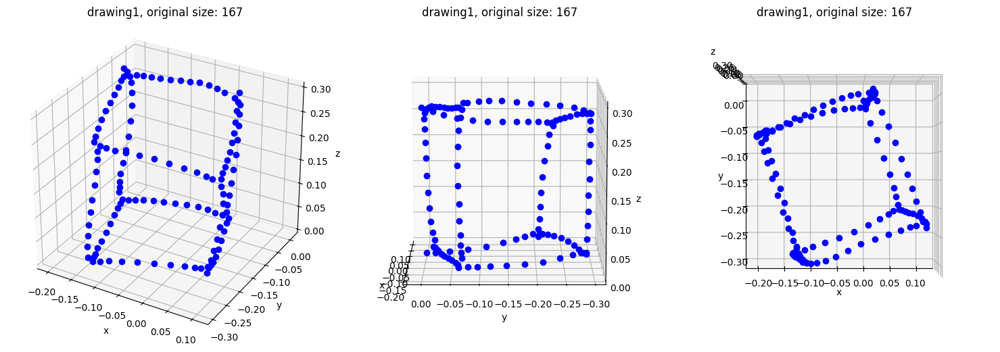

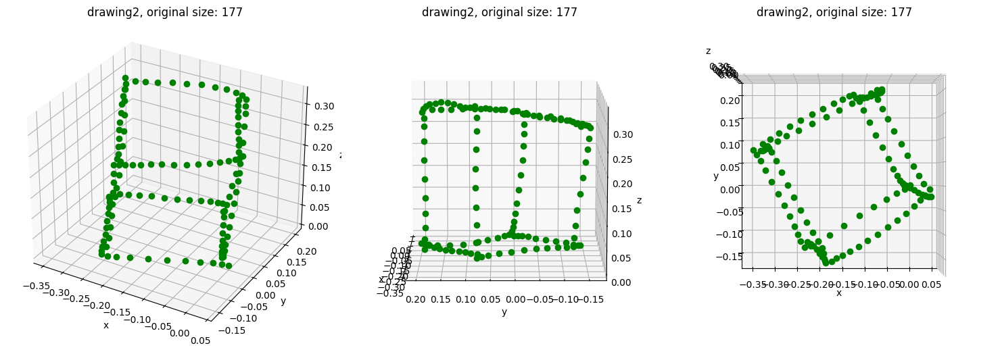

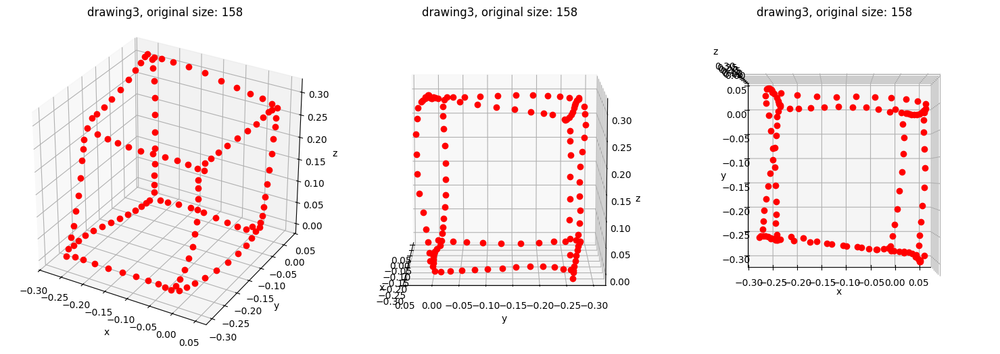

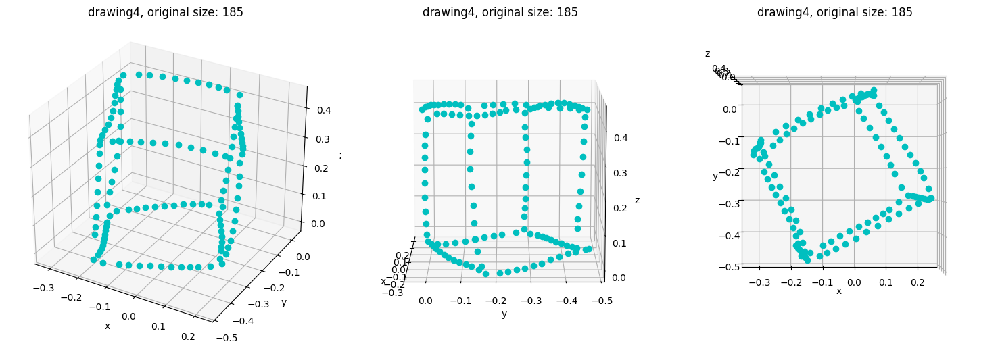

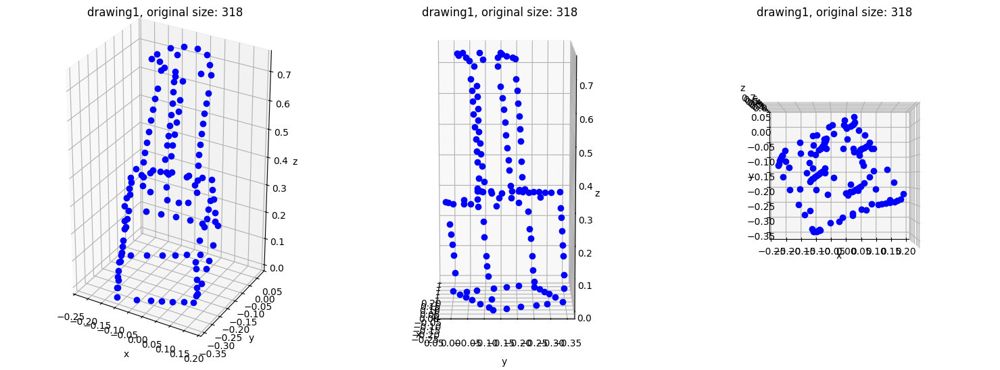

...

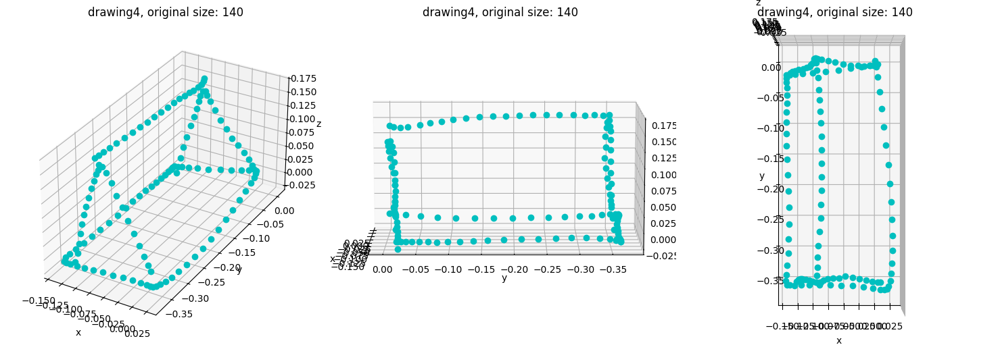

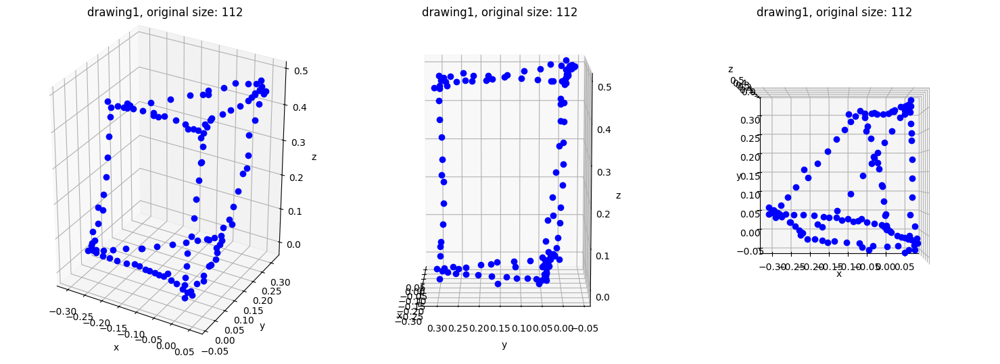

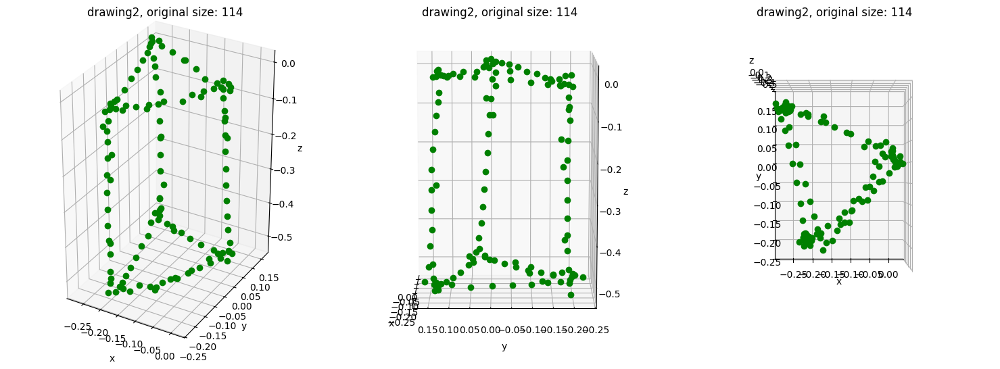

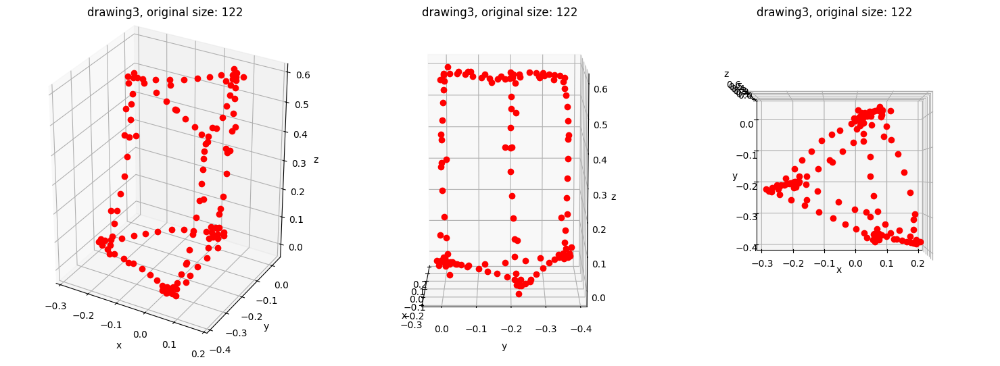

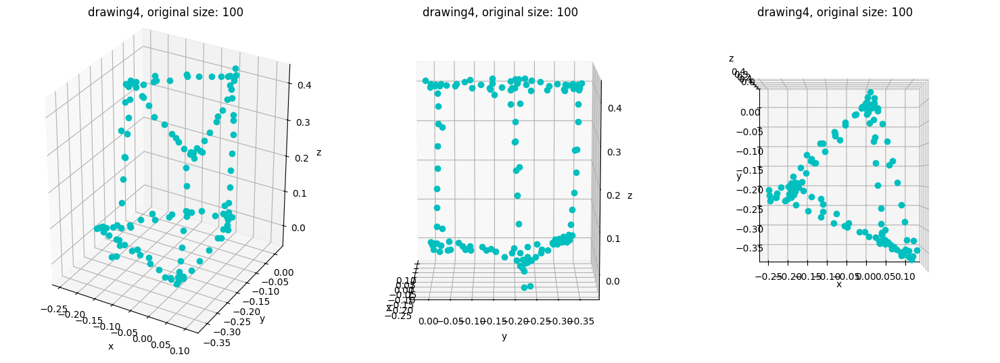

In [4]:
# show_all_plots("pyramid", "sample_data/")
show_validation_data("../dataset_RAW/validation/")